# Xenium spatial analysis
### **Author:** Nathalie Nataren
### **Date:** 24/10/2025

**Description:** The purpose of this analysis is to analyse Xenium spatial data as part of the metastatic melanoma ICI therapy response study (VBCT lab). This workbook contains the analysis for a single Xenium sample, with details shown below. This version of the analysis now includes log-transformation of counts after sc.pp.normalize_total().

**Sample:** BE_brain_non_res

**Settings**  

Cluster resolution=  0.5

PCs=  35

Nearest neighbours=  50

Lambda=  0.2

In [1]:
import anndata as ad
import os
import numpy as np
import pandas as pd
from IPython.display import display
import warnings
warnings.filterwarnings("ignore") 

import scipy.sparse as sparse
from scipy.io import mmread
from scipy.stats import pearsonr, pointbiserialr

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.lines import Line2D
from matplotlib import rc_context


import seaborn as sns
import scanpy as sc
sc.logging.print_header()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 1 # errors (0), warnings (1), info (2), hints (3)
plt.rcParams["font.family"] = "Arial"
sns.set_style("white")

import random
# Note that BANKSY itself is deterministic, here the seeds affect the umap clusters and leiden partition
seed = 1234
np.random.seed(seed)
random.seed(seed)

scanpy==1.9.5 anndata==0.10.2 umap==0.5.4 numpy==1.24.4 scipy==1.11.3 pandas==2.1.1 scikit-learn==1.3.1 statsmodels==0.14.0 igraph==0.11.2 pynndescent==0.5.10


### Create directories for processed and output data and set the dataset_name

In [2]:
## Set the dataset_name sample name to use throughout this analysis
dataset_name = "BE_brain_non_res"

# Create a path for raw data
raw_data = f"data/xenium/raw_data/"

# Create path for processed data
processed_path = f"data/xenium/processed/{dataset_name}/"

if not os.path.isdir(processed_path):
    os.makedirs(processed_path)
    print(f"Directory '{processed_path}' created successfully.")
else:
    print(f"Directory '{processed_path}' already exists.")


# Create path for output data
output_path = f"data/xenium/output/{dataset_name}/"

if not os.path.isdir(output_path):
    os.makedirs(output_path)
    print(f"Directory '{output_path}' created successfully.")
else:
    print(f"Directory '{output_path}' already exists.")


Directory 'data/xenium/processed/BE_brain_non_res/' already exists.
Directory 'data/xenium/output/BE_brain_non_res/' already exists.


## Load Xenium data
Allocate path to folder and the file name of the designated AnnaData Object (in `.h5ad` format) <br>

In [3]:
## Read in the raw AnnData file
adata = ad.read_h5ad(f"data/xenium/raw_data/{dataset_name}.h5ad")
#output_path = f"data/xenium/processed/{dataset_name}_xy.h5ad"
adata.obs_keys()

# Create 'xy' spatial coordinates from adata.obs
import numpy as np
adata.obsm['xy'] = np.vstack([adata.obs['x'], adata.obs['y']]).T

#adata.write(output_path)

### Create directories for processed and output data

### Float size downcasting in .obsm (64 to 32 bit)
I down cast information in the .obsm slot to 32-bit floats in order to reduce the workload on RAM during analysis.

In [4]:
# Function to check the float size of the adata.obsm data
from banksy_utils.object_downcasting_utils import check_float, downcast_float
check_float(adata)

# Function to downcast adata.obsm to 32 bit and check that the resulting array is an N-dimensional array
downcast_float(adata, "float32")

xy: shape=(85437, 2), dtype=float64
AnnData object with n_obs × n_vars = 85437 × 304
    obs: 'nucleus_area', 'nCount_Xenium', 'nFeature_Xenium', 'segmentation_method', 'nCount_BlankCodeword', 'nFeature_BlankCodeword', 'nCount_ControlCodeword', 'nFeature_ControlCodeword', 'nCount_ControlProbe', 'nFeature_ControlProbe', 'x', 'y', 'cell_area', 'nCount_SCT', 'nFeature_SCT'
    var: 'names'
    obsm: 'xy' object downcast to float32


In [5]:
# Check the float size of the adata.obsm data after downcasting to make sure the float type is correct
check_float(adata)

xy: shape=(85437, 2), dtype=float32


In [6]:
# Write the downcast file to AnnData format 
import anndata as ad
adata.write_h5ad(
    #filename = f"data/xenium/processed/{dataset_name}_float_32.h5ad",
    filename = f"{processed_path}{dataset_name}_float_32.h5ad",
    compression="gzip"
    )

# Define float adata file
float_adata = f"{dataset_name}_float_32.h5ad"

### Loading anndata file or converting raw files to anndata format  (h5ad)

- If the specified anndata file is present in the directory, the annadata file `.h5ad` in the file path can be read directly by setting the `load_adata_directly` to `True` <br>
- Otherwise, if the `AnnData` file is not present, `load_data` can convert the raw data of GCM and locations in `.csv` format to `.h5ad` directly.

In [7]:
from banksy_utils.load_data import load_adata, display_adata

# To either load data from .h5ad directly or convert raw data to .h5ad format
load_adata_directly = True

# Keys to specify coordinate indexes in the anndata Object
coord_keys = ('x', 'y', 'xy')

raw_y, raw_x, adata = load_adata(filepath=processed_path, adata_filename=float_adata, load_adata_directly=True, coord_keys=('x','y','xy'))

Looking for data/xenium/processed/BE_brain_non_res/BE_brain_non_res_float_32.h5ad
Attemping to read Annadata directly
Anndata file successfully loaded!
Attempting to concatenate spatial x-y under adata.obsm[xy]
Concatenation success!


### Display Anndata Object
Use `display_adata` to show summary of anndata object

In [8]:
# display_adata(adata)

### Preprocessing the Data using `Scanpy` 
We then preprocess the raw data as follows:

1. Making variable names unique (removing duplicate gene names)
2. Filtering out the mitochondria genes (`MT`)
3. We use `scanpy`'s built-in function `sc.pp.calculate_qc_metrics` and adding them in-place in the anndata object

In [9]:
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("MT-")

# Calulates QC metrics and put them in place to the adata object
sc.pp.calculate_qc_metrics(adata, 
                           qc_vars=["mt"], 
                           log1p=True, 
                           inplace=True,
                           percent_top=[10,20]
                           )

### Get preview of the preprocessed data: 
Display the qc-metrics under its observations and variables 

In [10]:
#display(adata.obs, adata.var)

## Visualize the histogram plot of `total_counts` and `n_genes` (Optional)
We can visualize the unfiltered and filtered histograms for `total_counts` and `n_genes` variables in the adata object <br> 

The filtered histograms are plotted after filtering by the upper threshold of total counts `total_counts_cuttoff`, the upper threshold of n_genes `n_genes_high_cutoff`, and the lower threshold of n_genes

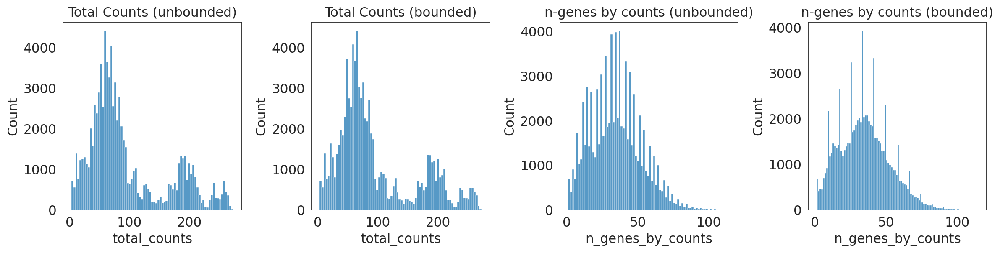

In [11]:
from banksy_utils.plot_utils import plot_qc_hist, plot_cell_positions

# bin options for fomratting histograms
# Here, we set 'auto' for 1st figure, 80 bins for 2nd figure. and so on
hist_bin_options = ['auto', 80, 80, 100]

plot_qc_hist(adata, 
         total_counts_cutoff = 300, # for visualization
         n_genes_high_cutoff = 1000, # for visualization
         n_genes_low_cutoff = 0, # for visualization
         bin_options = hist_bin_options)

## Do an initial filter of cells by their cell counts, MT count and gene counts
### We can then first filter cells by their counts, MT and gene filters.
**NOTE:** I have decided not to filter on the basis of gene counts as I don't have a sense of what is a biologically significant minimum counts per gene.

In [12]:
#from banksy_utils.filter_utils import filter_cells

# Filter cells with each respective filters
# adata = filter_cells(adata, 
#              min_count=10, 
#              max_count=1000, 
#              MT_filter=20, 
#              gene_filter=10)

### Plot the Histograms of the filtered dataset

In [13]:
# hist_bin_options = ['auto', 100, 60, 100]

# plot_qc_hist(adata,
#         total_counts_cutoff=2000,
#         n_genes_high_cutoff=2000, 
#         n_genes_low_cutoff= 0,
#         bin_options = hist_bin_options)

### Visualize the position of cells using a scatter plot


{'fig_size': (6, 6), 's': 0.2, 'c1': 'red', 'c2': 'slateblue', 'label1': 'Original cells', 'label2': 'Remaining cells', 'add_circle': False, 'puck_center': (3330, 3180), 'puck_radius': 2550}


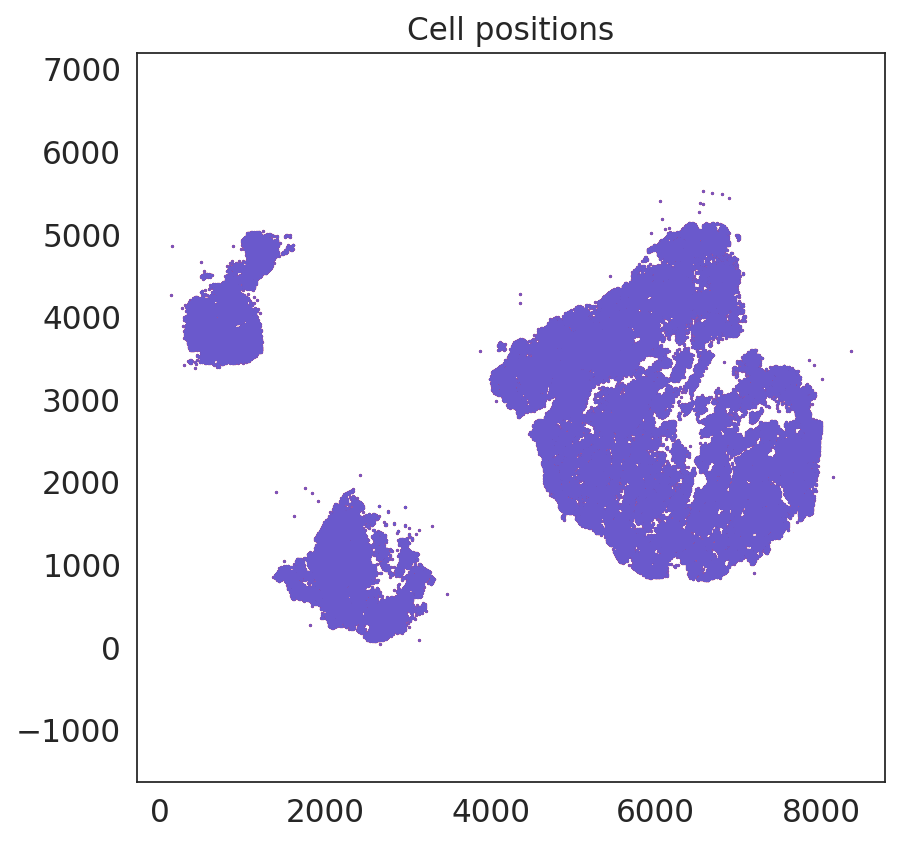

In [14]:
# Visualize cell positions in puck
plot_cell_positions(adata,
            raw_x,
            raw_y,
            coord_keys=coord_keys,
            fig_size = (6,6))

## Normalize and log transform data

Normalize data matrix using `normalize_total`.


In [15]:
## Save the raw counts
adata.layers["counts"] = adata.X.copy()

## Inspect the counts
print(adata.layers["counts"][:5,:5])

  (1, 2)	1.0


In [16]:
from banksy_utils.filter_utils import normalize_total, filter_hvg, print_max_min

## Normalizes the anndata dataset
normalize_total(adata)
print(adata.X)


--- Max-Min before normalization -----
Displaying max and min of Dataset
Max: 107.0, Min: 0.0

--- Max-Min after normalization -----
Displaying max and min of Dataset
Max: 72.0, Min: 0.0

  (1127, 0)	0.4235294117647059
  (1482, 0)	0.972972972972973
  (3371, 0)	0.42603550295857984
  (3617, 0)	0.4161849710982659
  (3756, 0)	0.4137931034482759
  (4653, 0)	0.8520710059171597
  (5123, 0)	5.662921348314606
  (5146, 0)	0.6315789473684211
  (5258, 0)	0.6371681415929203
  (5653, 0)	0.6605504587155964
  (5863, 0)	0.5070422535211268
  (5898, 0)	0.5806451612903225
  (6777, 0)	1.4117647058823528
  (7858, 0)	1.5
  (7993, 0)	0.549618320610687
  (10322, 0)	0.40223463687150834
  (10744, 0)	0.3829787234042553
  (11145, 0)	0.34615384615384615
  (12535, 0)	0.40223463687150834
  (13537, 0)	0.3529411764705882
  (14262, 0)	0.36
  (16047, 0)	1.6941176470588235
  (20468, 0)	0.27906976744186046
  (21525, 0)	0.277992277992278
  (22184, 0)	0.2801556420233463
  :	:
  (79275, 303)	1.2413793103448276
  (79436, 303)	

In [17]:
## Perform log-transformation and save the log-normalised in adata.raw
sc.pp.log1p(adata)
print(adata.X)


  (1127, 0)	0.3531392891064246
  (1482, 0)	0.6795415285041667
  (3371, 0)	0.3548982185675815
  (3617, 0)	0.34796661604694806
  (3756, 0)	0.3462762367178338
  (4653, 0)	0.6163044756170797
  (5123, 0)	1.8965580292655855
  (5146, 0)	0.48954822531870584
  (5258, 0)	0.49296800636598426
  (5653, 0)	0.5071491490366821
  (5863, 0)	0.41014895742059077
  (5898, 0)	0.4578330936254803
  (6777, 0)	0.8803587226480917
  (7858, 0)	0.9162907318741551
  (7993, 0)	0.4380086558406358
  (10322, 0)	0.3380671332910289
  (10744, 0)	0.32423966818557853
  (11145, 0)	0.2972515234679316
  (12535, 0)	0.3380671332910289
  (13537, 0)	0.30228087187293357
  (14262, 0)	0.3074846997479606
  (16047, 0)	0.9910707470639232
  (20468, 0)	0.24613306953890848
  (21525, 0)	0.24529031367752516
  (22184, 0)	0.2469816658701521
  :	:
  (79275, 303)	0.8070914399091631
  (79436, 303)	0.816761136527122
  (79493, 303)	1.2121361149650969
  (79581, 303)	1.2729656758128873
  (79600, 303)	0.9420432279765698
  (79611, 303)	0.745593655932487

In [18]:
adata.raw = adata.copy()

In [19]:
#print(adata.raw.var_names[:5])
print(adata.raw.X[:5, :5])

  (1, 2)	0.32571944484495113


### Filter by Highly Variable Genes (HVG) using a specified threshold

We use the **raw count data** (flavor = `"seurat_v3"`) or **log-transformed data** (flavor = `"seurat"`). Here, we recommend using the default `seurat` flavor from `Scanpy`.

Here we keep the original AnnData object (`adata_allgenes`) for the analysis of the results produced by BANKSY if nessecary. However, we will mostly be running banksy with the filtered AnnData object (`adata`)

**NOTE:** Banksy author Vipul Singhal did state at a Sydney Precision Data Science Centre talk (12/5/2025) that HVG is not recommended for Xenium data given how few genes there are in these analyses.

In [20]:
# adata, adata_allgenes = filter_hvg(adata,
#             n_top_genes = 2000,
#             flavor="seurat")

## Generate spatial weights graph

#### In BANKSY, we imagine edges / connections in the graph to represent neighbour relationships between cells

In doing so, the banksy algorithm requires the following specifications in the main BANKSY algorithm:

1. The number of spatial neighbours `num_neighbours`, this is also known as the $k_{geom}$ parameter in the manuscript.
    
2. Assigning weights (dependent on inter-cell spatial distances) to edges in the connected spatial graph. By default, we use the `gaussian decay` option, where weights decay as a function of distnace to the index cell with $\sigma$ = `sigma`. As default, we set $\sigma$ to be the median distance between cells, and do not prescribe any cutoff-radius `p_outside` (no cutoff is conducted).

3. The Azumithal Gabor Filter parameter `max_m` which indicates whether to use the AGF (`max_m = 1`) or just the mean expression (`max_m = 0`). By default, we set `max_m = 1`.
    
    
### Construction of the spatial $k_{geom}$ Nearest-Neighbour graph

We represent connections between cells and its neighbours in a graph $G = \{N,E,W\}$, comprising of a set of nodes $n \in N$. edges representing connectivity between cells $e \in E$, the edges are be weighted $w \in W$ as a function of the spatial distance between cells.
    
Weight of edges can be represented by uniform distance (i.e., a closer neighbour will have a higher weight), or using `reciprocal` ($\frac{1}{r})$. As mentioned above, BANKSY by default applies a gaussian envelope function to map the distance (between nodes) to the `weights` the connection of cell-to-neighbor

In [21]:
from banksy.main import median_dist_to_nearest_neighbour

# set params
# ==========
plot_graph_weights = True
k_geom = 15 # only for fixed type
max_m = 1 # azumithal transform up to kth order
nbr_weight_decay = "scaled_gaussian" # can also be "reciprocal", "uniform" or "ranked"

# Find median distance to closest neighbours, the median distance will be `sigma`
nbrs = median_dist_to_nearest_neighbour(adata, key = coord_keys[2])


Median distance to closest cell = 7.3431374974184624

---- Ran median_dist_to_nearest_neighbour in 0.42 s ----



### Generate spatial weights from distance

Here, we generate the spatial weights using the gaussian decay function from the median distance to the k-th nearest neighbours as specified earlier.

The utility functions `plot_edge_histograms`, `plot_weights`, `plot_theta_graph` can be used to visualize the characteristics of the edges, weights and theta (from the AGF) respectively.

### Optional Visualization of Weights and edge graphs

(1) **Visualize the edge histogram** to show the histogram of distances between cells and the weights between cells by setting `plt_edge_hist = True`

(2) **Visualize weights** by plotting the connections. Line thickness is proportional to edge weight (normalized by highest weight across all edges) by setting `plt_weights = True`

(3) **Visualize weights with Azimuthal angles**. Visualizing the azimuthal angles computed by the AGF by colour, the azimuthal connectivities are annotated in red. Warning: this plot many take a few minutes to compute for large datasets. By default, `plt_agf_angles = False`

(4) **Visualize angles around random cell**. Plot points around a random index cell, annotated with angles from the index cell. `plot_theta = True`


Median distance to closest cell = 7.3431374974184624

---- Ran median_dist_to_nearest_neighbour in 0.44 s ----

---- Ran generate_spatial_distance_graph in 0.89 s ----

---- Ran row_normalize in 0.41 s ----

---- Ran generate_spatial_weights_fixed_nbrs in 4.63 s ----

----- Plotting Edge Histograms for m = 0 -----

Edge weights (distances between cells): median = 17.290388102160776, mode = 16.05718580874241

---- Ran plot_edge_histogram in 0.10 s ----


Edge weights (weights between cells): median = 0.058647028392558, mode = 0.032703562261752146

---- Ran plot_edge_histogram in 0.10 s ----

---- Ran generate_spatial_distance_graph in 1.39 s ----

---- Ran theta_from_spatial_graph in 1.16 s ----

---- Ran row_normalize in 0.40 s ----

---- Ran generate_spatial_weights_fixed_nbrs in 6.35 s ----

----- Plotting Edge Histograms for m = 1 -----

Edge weights (distances between cells): median = 24.388819442265834, mode = 23.238378750119228

---- Ran plot_edge_histogram in 0.12 s ----


Edge

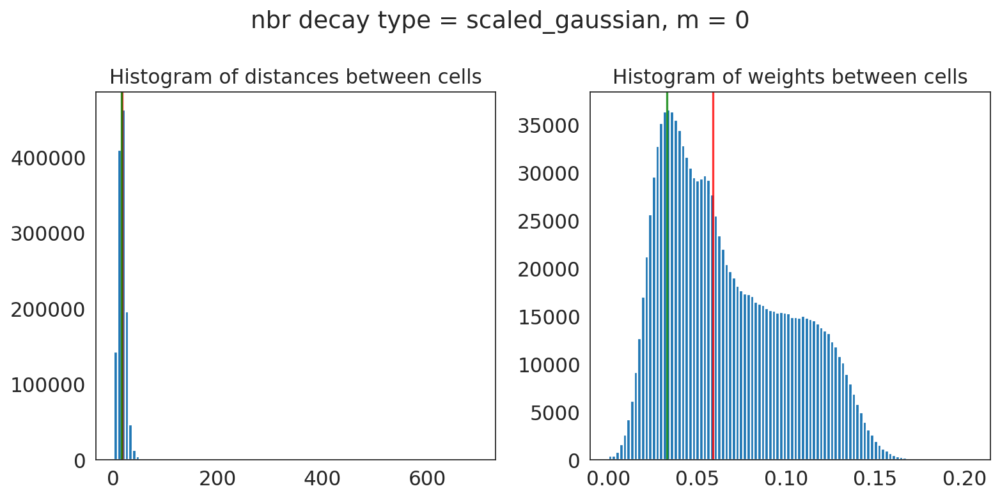

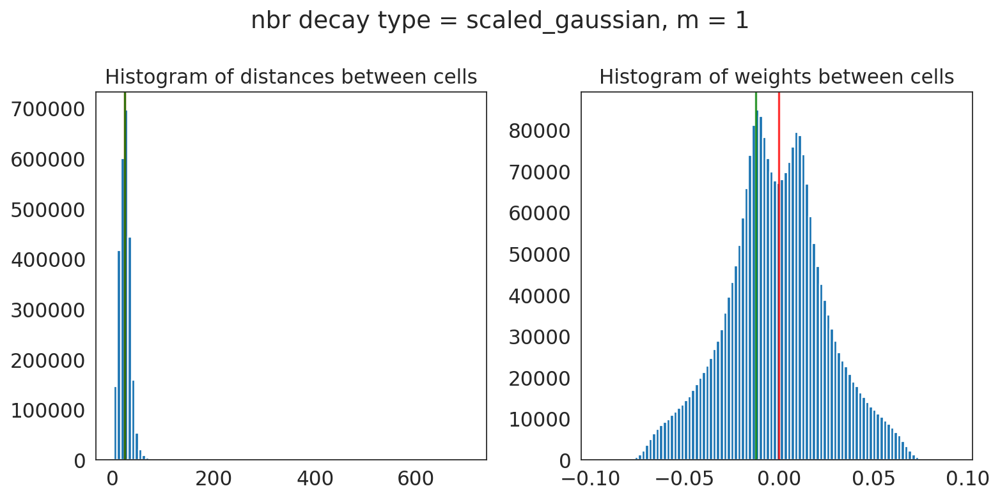

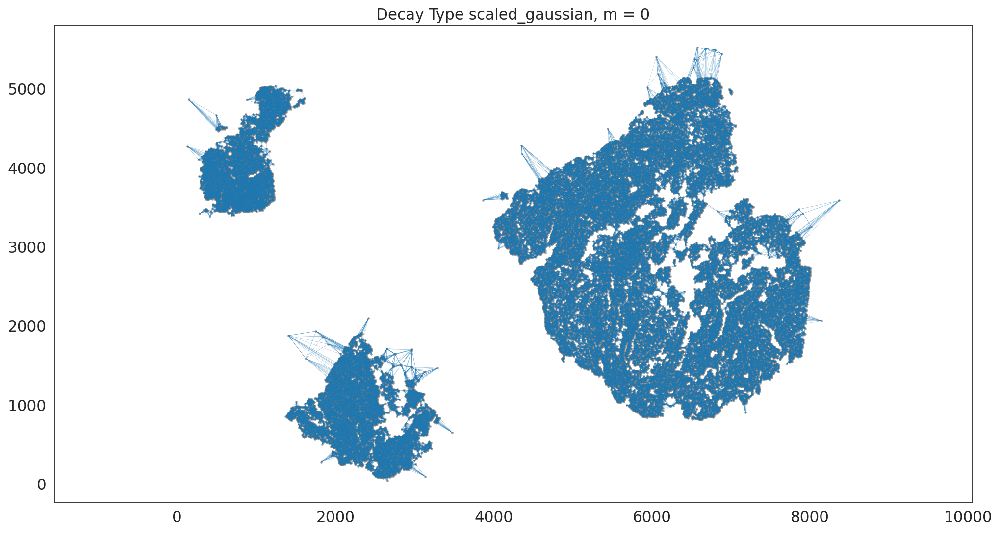

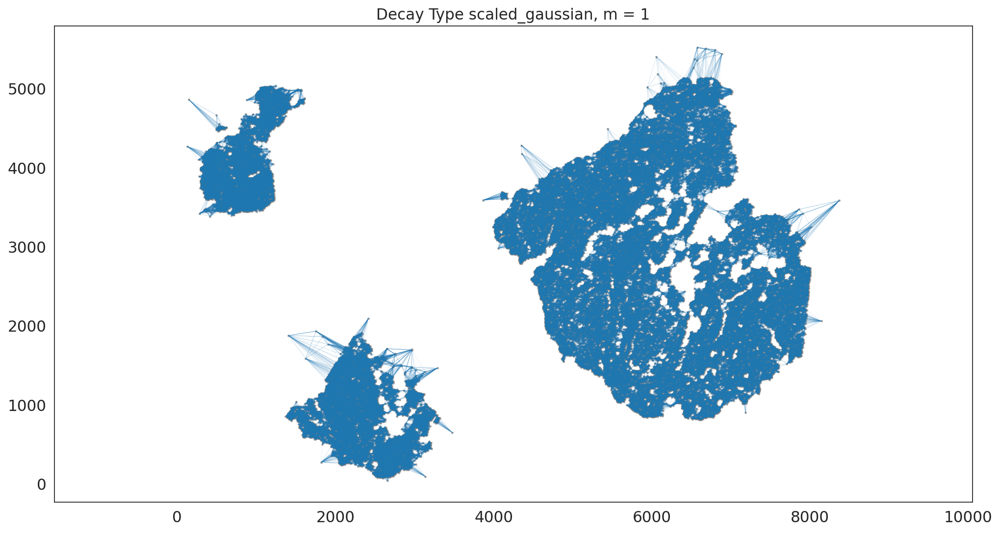

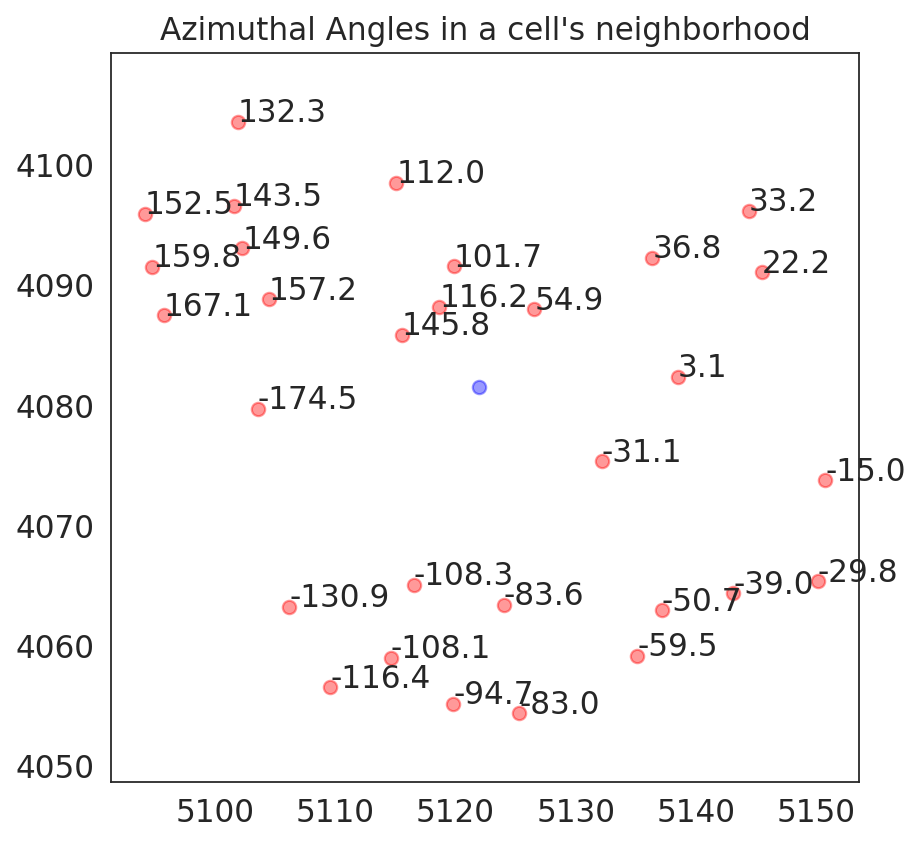

In [22]:
from banksy.initialize_banksy import initialize_banksy

banksy_dict = initialize_banksy(
    adata,
    coord_keys,
    k_geom,
    nbr_weight_decay=nbr_weight_decay,
    max_m=max_m,
    plt_edge_hist=True,
    plt_nbr_weights=True,
    plt_agf_angles=False, # takes long time to plot
    plt_theta=True,
)

## Generate BANKSY matrix

To generate the BANKSY matrix, we proceed with the following:

1. Matrix multiply sparse CSR weights matrix with cell-gene matrix to get **neighbour matrix** and the **AGF matrix** if `max_m` > 1
2. Z-score both matrices along **genes**
3. Multiply each matrix by a weighting factor $\lambda$ (We refer to this parameter as `lambda` in our manuscript and code)
4. Concatenate the matrices along the genes dimension in the form -> `horizontal_concat(cell_mat, nbr_mat, agf_mat)`

Here, we save all the results in the dictionary (`banksy_dict`), which contains the results from the subsequent operations for BANKSY. 

In [23]:
## Parameter labels for f-string labelling
res_label = "0.50"
lambda_label = "0.20" #set to one of the lambda values for now, this can be switched

In [24]:
from banksy.embed_banksy import generate_banksy_matrix

# The following are the main hyperparameters for BANKSY
resolutions = [0.5] # clustering resolution for UMAP
lambda_list = [0.2] # list of lambda parameters

banksy_dict, banksy_matrix = generate_banksy_matrix(adata, banksy_dict, lambda_list, max_m)

Runtime Oct-27-2025-10-57

304 genes to be analysed:
Gene List:
Index(['ACER1', 'ACTA2', 'ADAM12', 'AHNAK2', 'AIF1', 'AKR1C1', 'ALOX5AP',
       'APCDD1', 'APOD', 'AQP1',
       ...
       'TYR', 'TYROBP', 'TYRP1', 'UBE2C', 'VCAM1', 'VEGFA', 'VIM', 'VWF',
       'WDFY4', 'ZNF667-AS1'],
      dtype='object', length=304)

Check if X contains only finite (non-NAN) values
Decay Type: scaled_gaussian
Weights Object: {'weights': {0: <85437x85437 sparse matrix of type '<class 'numpy.float64'>'
	with 1281555 stored elements in Compressed Sparse Row format>, 1: <85437x85437 sparse matrix of type '<class 'numpy.complex128'>'
	with 2563110 stored elements in Compressed Sparse Row format>}}

Nbr matrix | Mean: 0.11 | Std: 0.23
Size of Nbr | Shape: (85437, 304)
Top 3 entries of Nbr Mat:

[[0.         0.         0.06444159]
 [0.         0.         0.10592978]
 [0.         0.         0.        ]]

AGF matrix | Mean: 0.04 | Std: 0.06
Size of AGF mat (m = 1) | Shape: (85437, 304)
Top entries of AGF:
[[

In [25]:
dict_matrix=banksy_dict["scaled_gaussian"][0.2]['adata'].obs.keys()
print(dict_matrix)
#dict_matrix.to_csv(f"data/xenium/processed/{dataset_name}_dict_matrix.csv")

Index(['nucleus_area', 'nCount_Xenium', 'nFeature_Xenium',
       'segmentation_method', 'nCount_BlankCodeword', 'nFeature_BlankCodeword',
       'nCount_ControlCodeword', 'nFeature_ControlCodeword',
       'nCount_ControlProbe', 'nFeature_ControlProbe', 'x', 'y', 'cell_area',
       'nCount_SCT', 'nFeature_SCT', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts',
       'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes',
       'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'],
      dtype='object')


### Append Non-spatial results to the `banksy_dict` for comparsion

In [26]:
from banksy.main import concatenate_all

banksy_dict["nonspatial"] = {
    # Here we simply append the nonspatial matrix (adata.X) to obtain the nonspatial clustering results
    0.0: {"adata": concatenate_all([adata.X], 0, adata=adata), }
}

print(banksy_dict['nonspatial'][0.0]['adata'])

Scale factors squared: [1.]
Scale factors: [1.]
AnnData object with n_obs × n_vars = 85437 × 304
    obs: 'nucleus_area', 'nCount_Xenium', 'nFeature_Xenium', 'segmentation_method', 'nCount_BlankCodeword', 'nFeature_BlankCodeword', 'nCount_ControlCodeword', 'nFeature_ControlCodeword', 'nCount_ControlProbe', 'nFeature_ControlProbe', 'x', 'y', 'cell_area', 'nCount_SCT', 'nFeature_SCT', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'names', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'is_nbr', 'k'


## Determine number of PCs to input into UMAP
The noise_equiv_singular_value() function helps to determine the number of principal components to use for UMAP.


In [27]:
output_path

'data/xenium/output/BE_brain_non_res/'

In [28]:

#adata.var_names # feature names
#adata.obs_names # cell ids

## Import the noise_equiv_singular_value() function 
from banksy_utils.pca import plot_singular_values
import numpy as np

# X is a matrix of cells vs gene names
# Store the cells vs genes (features) as a matrix for PCA
X = adata.X.toarray()

# Transpose the matirx so that the columns are the genes (features) not the cell IDs
X = X.T
X.shape

# Calculate the higher singular value 
from banksy_utils.pca import noise_equiv_singular_value

noise_sv, all_permuted_svs = noise_equiv_singular_value(
    data = X,
    num_permutations = 50,
    #average_type = "mean",
    verbose = True
    )
print(f"Noise threshold (mean top singular value of permuted data): {noise_sv:.4f}")

List of all permuted top singular values:
[105.59977843 105.51071745 105.76217051 105.6536644  105.5916535  105.63143846 105.46479544 105.77351684 105.64667167 105.62941539 105.57802938 105.83527373
 105.67049909 105.59274485 105.63573097 105.63673856 105.46678508 105.65769152 105.4573367  105.73599748 105.62583896 105.59226914 105.38761711 105.50698284
 105.53746932 105.69188097 105.61733819 105.88291643 105.33837433 105.55310438 105.54477765 105.36138677 105.56508895 105.77721071 105.49358612 105.85996155
 105.75621199 105.64420206 105.33726075 105.82541898 105.45328674 105.84530838 105.58754043 105.59738009 105.62439878 105.6968984  105.48133929 105.64092598
 105.6863455  105.4931158 ]

---- Ran noise_equiv_singular_value in 105.09 s ----

Noise threshold (mean top singular value of permuted data): 105.6107


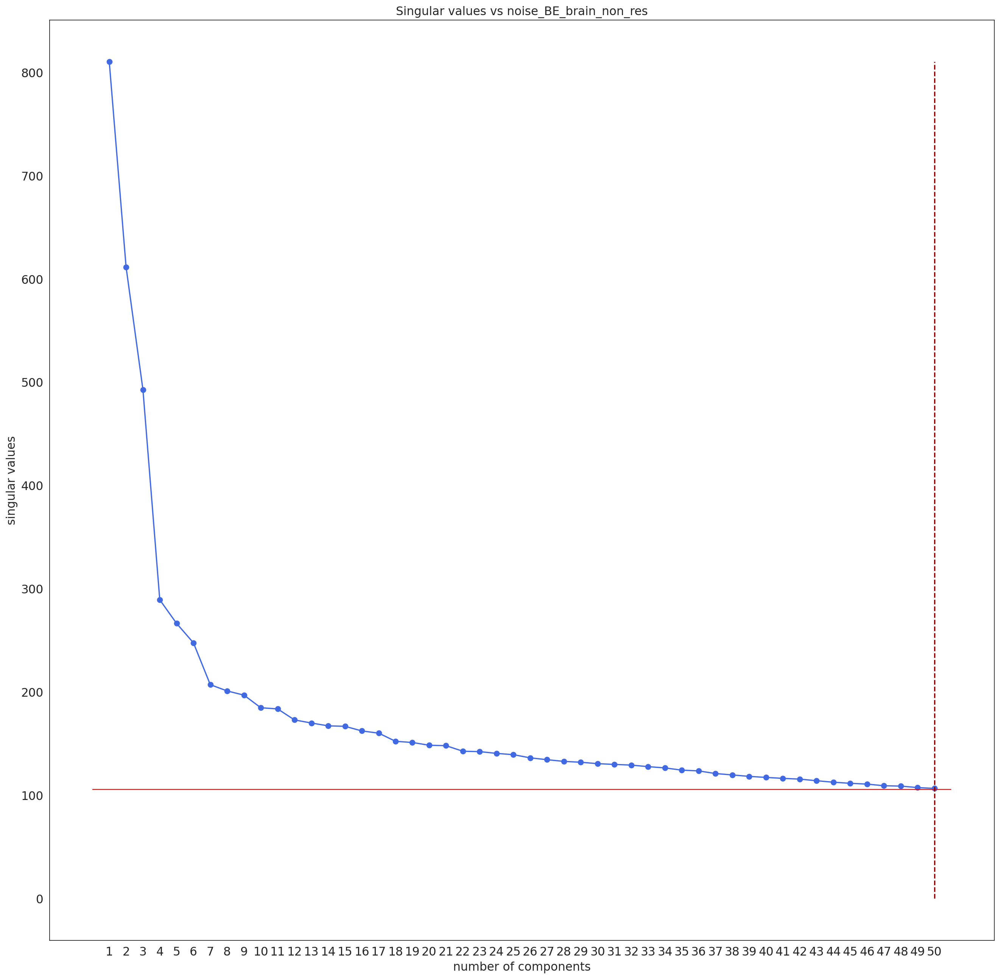

In [29]:
## Perform PCA 
from sklearn.decomposition import PCA

pca = PCA(n_components=50).fit(X)


## Plot singular values vs noise to determine the optimal number of PC above the noise threshold
from banksy_utils.pca import plot_singular_values

plot_singular_values(
    pca, 
    noise_highest_sv=noise_sv, 
    title=f"Singular values vs noise_{dataset_name}",
    figsize=(20,20),
    save_path = f"{output_path}singular_values_vs_noise_{dataset_name}"
    )

In [30]:
# from banksy_utils.pca import plot_remaining_variance
# plot_remaining_variance(pca, figsize=(15,15))

## Reduce dimensions of each data matrix
We utilize two common methods for dimensionality reduction:

1. PCA (using `scikit-learn`), we reduce the size of the matrix from $3*N_{genes}$ to `pca_dims`. As a default settings, we reduce to 20 dimensions.
2. UMAP (`UMAP` package), which we use to visualize expressions of clusters in the umap space (2-D space).

Current decay types: ['scaled_gaussian', 'nonspatial']

Reducing dims of dataset in (Index = scaled_gaussian, lambda = 0.2)

Setting the total number of PC = 30
Original shape of matrix: (85437, 912)
Reduced shape of matrix: (85437, 30)
------------------------------------------------------------
min_value = -25.255290446626674, mean = -8.481359401917295e-15, max = 34.11807018435734

Conducting UMAP and adding embeddings to adata.obsm["reduced_pc_30_umap"]
UMAP embedding
------------------------------------------------------------
shape: (85437, 2)


AxisArrays with keys: reduced_pc_30, reduced_pc_30_umap

Reducing dims of dataset in (Index = nonspatial, lambda = 0.0)

Setting the total number of PC = 30
Original shape of matrix: (85437, 304)
Reduced shape of matrix: (85437, 30)
------------------------------------------------------------
min_value = -22.323946202015943, mean = -1.7786369654976974e-17, max = 62.153167924380924

Conducting UMAP and adding embeddings to adata.obsm["reduc

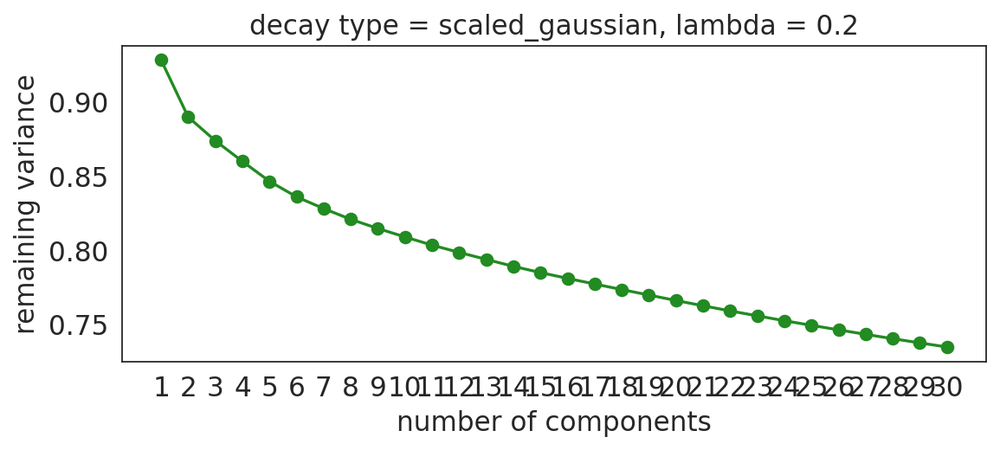

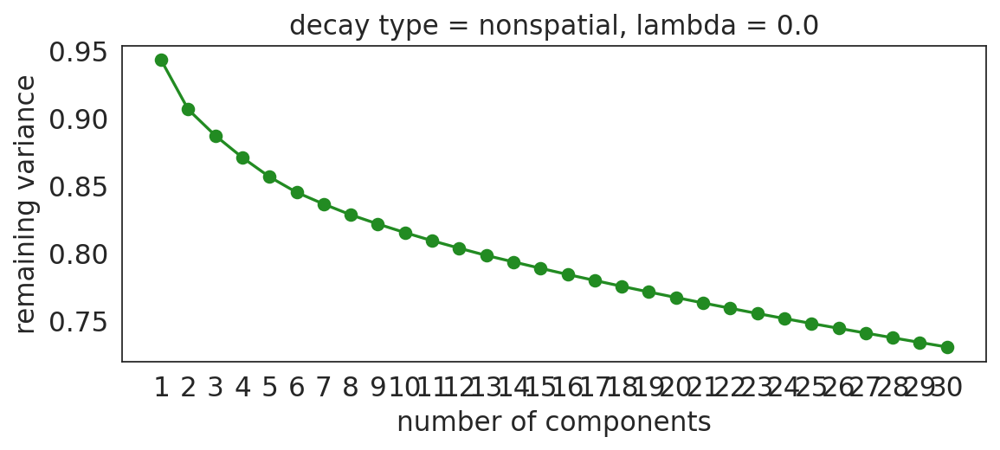

In [31]:
from banksy_utils.umap_pca import pca_umap

pca_dims = [30] # Dimensionality in which PCA reduces to

pca_umap(banksy_dict,
         pca_dims = pca_dims,
         add_umap = True,
         #plt_remaining_var = True,
         )

#pca label for downstream f-string labels
pca_label = "30"

### Cluster cells using a partition algorithm

For the purpose of this dataset, we cluster cells using the `leiden` algorithm (use `!pip install leidenalg` if package missing) partition methods. Other clustering algorithms include `louvain` (another resolution based clustering algorithm), or `mclust` (a clustering based on gaussian mixture model). 

Note that by default, we recommend resolution-based clustering (i.e., `leiden` or `louvain`) if no prior information on the number of clusters known. However, if the number of clusters is known *a priori*, the user can use `mclust` (gaussian-mixture model) by specifying the number of clusters beforehand.

In [32]:
from banksy.cluster_methods import run_Leiden_partition_parallel

## Parallelised leiden partitioning function for clustering, if a computer has n cores, set max_workers to n-1
results_df, max_num_labels = run_Leiden_partition_parallel(
    banksy_dict,
    resolutions,
    num_nn=50,
    max_workers=7 # 8-core laptop
)

reduced_pc_30 

reduced_pc_30_umap 

reduced_pc_30 

reduced_pc_30_umap 


Nearest-neighbour weighted graph (dtype: float64, shape: (85437, 85437)) has 4271850 nonzero entries.
---- Ran find_nn in 717.36 s ----


Nearest-neighbour connectivity graph (dtype: int16, shape: (85437, 85437)) has 4271850 nonzero entries.

(after computing shared NN)
Allowing nearest neighbours only reduced the number of shared NN from 127527259 to 4242861.


Shared nearest-neighbour (connections only) graph (dtype: int16, shape: (85437, 85437)) has 3674280 nonzero entries.

Shared nearest-neighbour (number of shared neighbours as weights) graph (dtype: int16, shape: (85437, 85437)) has 3674280 nonzero entries.

sNN graph data:
[18 17 15 ...  6  5  5]

---- Ran shared_nn in 12.41 s ----


-- Multiplying sNN connectivity by weights --


shared NN with distance-based weights graph (dtype: float64, shape: (85437, 85437)) has 3674280 nonzero entries.
shared NN weighted graph data: [0.2793562  0.27957099 0.2798584

,param_str,decay,lambda_param,num_pcs,resolution,num_labels,labels,adata,relabeled
nonspatial_pc30_nc0.00_r0.50,nonspatial_pc30_nc0.00_r0.50,nonspatial,0.0,30,0.5,12,"Label object:\nNumber of labels: 12, number of...",[[[View of AnnData object with n_obs × n_vars ...,"Label object:\nNumber of labels: 12, number of..."
scaled_gaussian_pc30_nc0.20_r0.50,scaled_gaussian_pc30_nc0.20_r0.50,scaled_gaussian,0.2,30,0.5,13,"Label object:\nNumber of labels: 13, number of...",[[[View of AnnData object with n_obs × n_vars ...,"Label object:\nNumber of labels: 13, number of..."


## Plot results

### Visualize the clustering results from BANKSY, including the clusters from the Umap embbedings

Saving figure at data/xenium/output/BE_brain_non_res/BE_brain_non_res_nonspatial_pc30_nc0.00_r0.50_spatialmap.png
number of labels: 12
---- Ran plot_2d_embeddings in 0.01 s ----

number of labels: 12
---- Ran plot_2d_embeddings in 0.01 s ----

number of labels: 12
---- Ran plot_2d_embeddings in 0.01 s ----

---- Ran row_normalize in 0.00 s ----


matrix multiplying labels x weights x labels-transpose ((12, 85437) x (85437, 85437) x (85437, 12))

Saving full-figure at data/xenium/output/BE_brain_non_res/BE_brain_non_res_nonspatial_pc30_nc0.00_r0.50_full_figure.png
Saving figure at data/xenium/output/BE_brain_non_res/BE_brain_non_res_scaled_gaussian_pc30_nc0.20_r0.50_spatialmap.png
number of labels: 13
---- Ran plot_2d_embeddings in 0.01 s ----

number of labels: 13
---- Ran plot_2d_embeddings in 0.01 s ----

number of labels: 13
---- Ran plot_2d_embeddings in 0.01 s ----

---- Ran row_normalize in 0.00 s ----


matrix multiplying labels x weights x labels-transpose ((13, 85437) x (85437

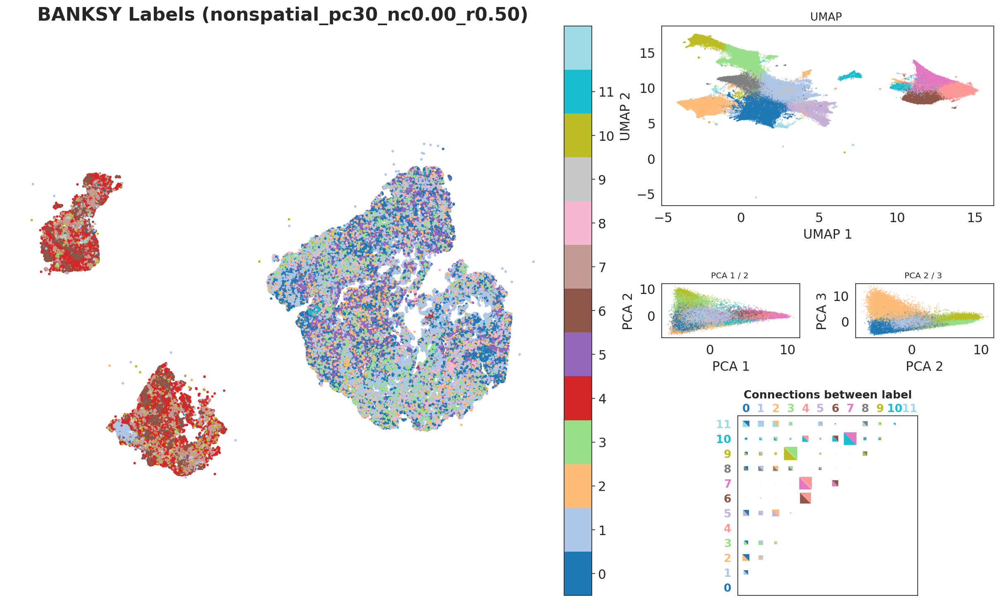

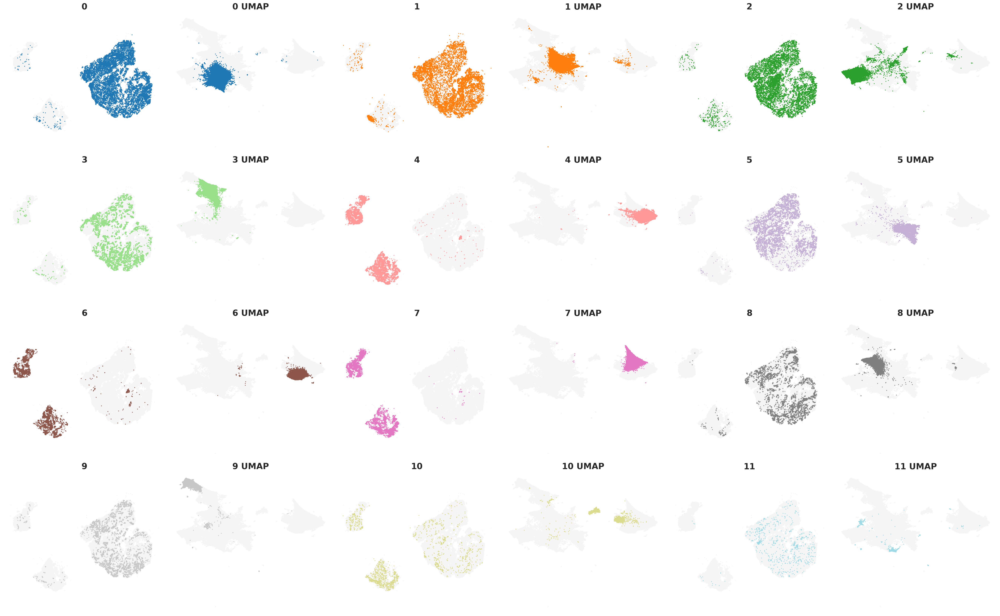

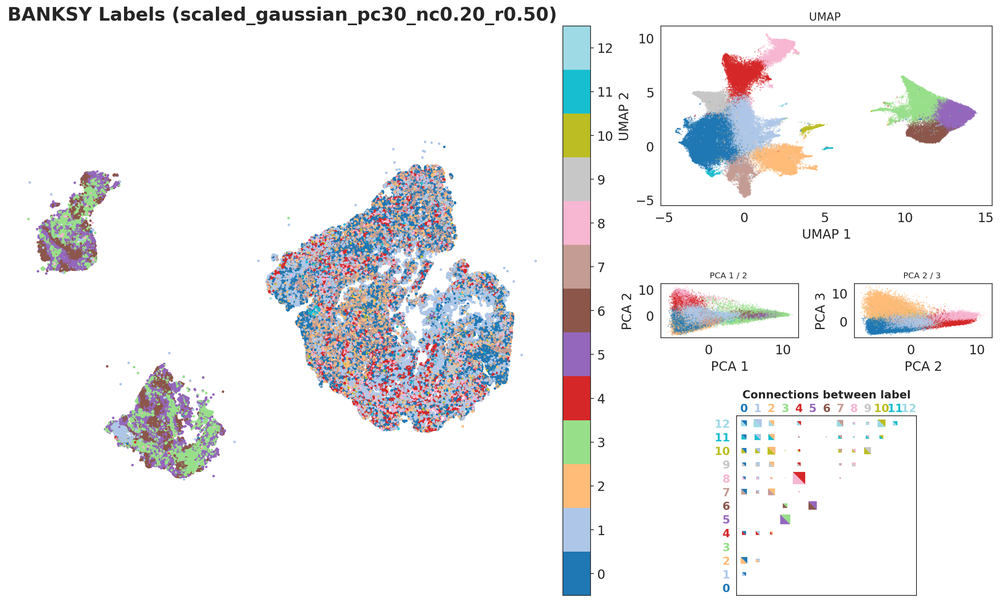

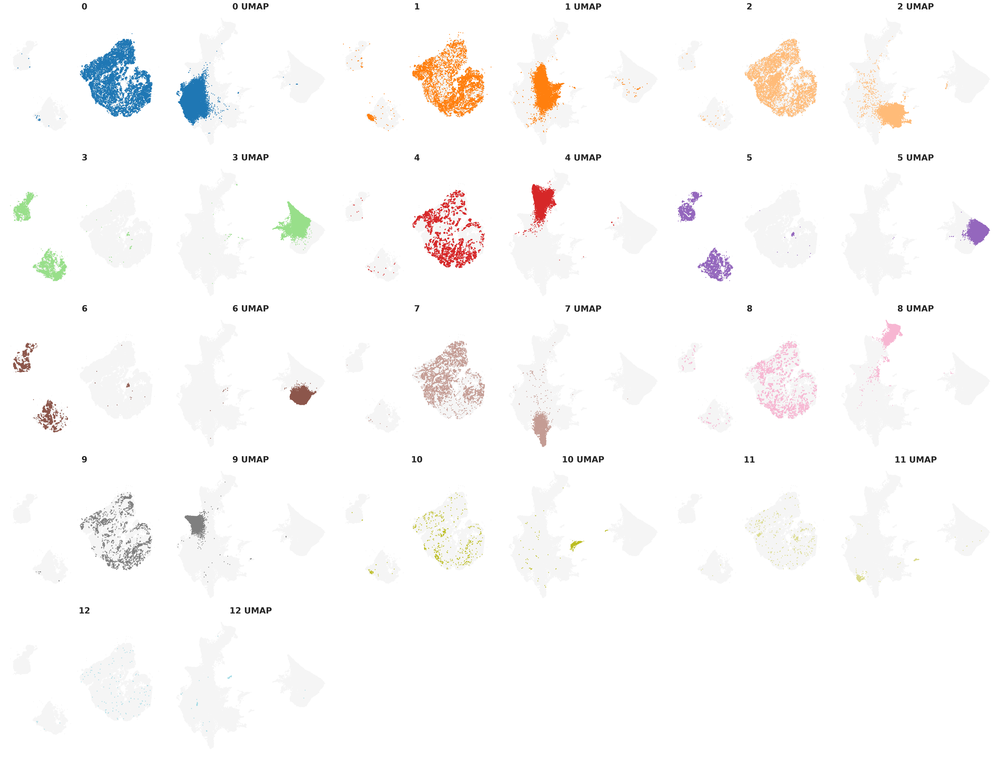

In [33]:
from banksy.plot_banksy import plot_results

c_map =  'tab20' # specify color map
weights_graph =  banksy_dict[f"{nbr_weight_decay}"]['weights'][0]

plot_results(
    results_df,
    weights_graph,
    c_map,
    match_labels = False,
    coord_keys = coord_keys,
    max_num_labels  =  max_num_labels, 
    #save_path = os.path.join(file_path, 'tmp_png'),
    save_fig = True, # save the spatial map of all clusters
    save_seperate_fig = True, # save the figure of all clusters plotted seperately
    dataset_name = f"{dataset_name}",
    save_fullfig=True,
    save_path = output_path
)

### Cell type annotation - lambda = 0.2

In [34]:
from banksy_utils.cluster_utils import pad_clusters, create_spatial_nonspatial_adata,  refine_cell_types

# Here we manually assign clusters to their identity using a dictionary, using just numbers as placeholders prior to manual annotation
cluster2annotation_spatial = {
    "0" : "0",
    "1" : "1",
    "2" : "2",
    "3" : "3",
    "4" : "4",
    "5" : "5",
    "6" : "6",
    "7" : "7",
    "8" : "8",
    "9" : "9",
    "10" : "10",
    "11" : "11",
    "12" : '12'
}

pad_clusters(cluster2annotation_spatial, list(range(max_num_labels)))

cluster2annotation_nonspatial = {
    "0" : "0",
    "1" : "1",
    "2" : "2",
    "3" : "3",
    "4" : "4",
    "5" : "5",
    "6" : "6",
    "7" : "7",
    "8" : "8",
    "9" : "9",
    "10" : "10",
    "11" : "11"
}

In [35]:
## Save annotations in two different anndata objects (adata_spatial and adata_nonspatial)

adata_spatial, adata_nonspatial = create_spatial_nonspatial_adata(results_df,
                                    pca_dims,
                                    lambda_list, 
                                    resolutions,
                                    cluster2annotation_spatial,
                                    cluster2annotation_nonspatial)

Using spatial params: scaled_gaussian_pc30_nc0.20_r0.50
nonspatial_pc30_nc0.00_r0.50


In [36]:
## Store the cluster labels as a string in .obs
banksy_dict[f"{nbr_weight_decay}"][0.2]['adata'] #lambda = 0.20
adata_spatial.obs[f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}"]= adata_spatial.obs[f"labels_scaled_gaussian_pc{pca_label}_nc{lambda_label}_r{res_label}"].astype(str)

In [37]:
## Pull out genes as data frame
genes = adata.var_names
gene_df = pd.DataFrame(adata.X.toarray(), columns=genes, index=adata.obs_names)
#print(gene_df)

gene_count_across_cells = gene_df.sum(axis=0)
gene_count_across_cells.to_frame()
gene_count_across_cells.columns = ["gene", "counts"]

print(gene_count_across_cells)
gene_count_across_cells.to_csv(f"{processed_path}{dataset_name}_gene_count_across_cells_not_SCTransformed.csv")
type(gene_count_across_cells)

ACER1            61.247620
ACTA2         11543.629493
ADAM12         6738.949193
AHNAK2          352.401809
AIF1          23159.149589
                  ...     
VEGFA         15970.081176
VIM           68735.367893
VWF           14083.363253
WDFY4          4388.010734
ZNF667-AS1     2306.091892
Length: 304, dtype: float64


pandas.core.series.Series

In [38]:
print(adata_spatial.__repr__())

AnnData object with n_obs × n_vars = 85437 × 912
    obs: 'nucleus_area', 'nCount_Xenium', 'nFeature_Xenium', 'segmentation_method', 'nCount_BlankCodeword', 'nFeature_BlankCodeword', 'nCount_ControlCodeword', 'nFeature_ControlCodeword', 'nCount_ControlProbe', 'nFeature_ControlProbe', 'x', 'y', 'cell_area', 'nCount_SCT', 'nFeature_SCT', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'labels_scaled_gaussian_pc30_nc0.20_r0.50', 'cell type', 'banksy_cluster_pc30_nc0.20_r0.50'
    var: 'names', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'is_nbr', 'k'
    obsm: 'reduced_pc_30', 'reduced_pc_30_umap', 'xy'


# Top expressed genes per cluster

### Spatial clustering results

In [39]:
import scanpy as sc

## Rank genes and identify cluster gene markers
sc.tl.rank_genes_groups(
    adata_spatial,
    groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}",
    method='wilcoxon',
    key_added=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers"
)


In [40]:
## Check which cluster keys exist
adata_spatial.uns[f'banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers']['names'].dtype

dtype((numpy.record, [('0', 'O'), ('1', 'O'), ('2', 'O'), ('3', 'O'), ('4', 'O'), ('5', 'O'), ('6', 'O'), ('7', 'O'), ('8', 'O'), ('9', 'O'), ('10', 'O'), ('11', 'O'), ('12', 'O')]))

In [41]:
## Using the filter_ranked_genes_by_type to create a key for 
from banksy_utils.annotation_utils import filter_ranked_genes_by_type

key_filtered = filter_ranked_genes_by_type(
    adata_spatial,
    key=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers",
    top_n=100,
    gene_type = "raw",
    new_key_suffix="_raw",
)

Copied cluster labels to adata.obs['banksy_cluster_pc30_nc0.20_r0.50_raw']
Stored filtered raw markers in adata.uns['banksy_cluster_pc30_nc0.20_r0.50_markers_raw']


In [42]:
key_filtered

'banksy_cluster_pc30_nc0.20_r0.50_markers_raw'

In [43]:
adata_spatial.uns[key_filtered]

{'params': {'groupby': 'banksy_cluster_pc30_nc0.20_r0.50',
  'reference': 'rest',
  'method': 'wilcoxon',
  'use_raw': False,
  'layer': None,
  'corr_method': 'benjamini-hochberg'},
 'names': rec.array([('CD163', 'CD163', 'CCL5', 'QPCT', 'NOTCH3', 'PMEL', 'APOD', 'PTGDS', 'VWF', 'COL6A1', 'MZB1', 'IDO1', 'CD163'),
            ('CD68', 'SELL', 'CD3E', 'PMEL', 'SPARCL1', 'TRPM1', 'VEGFA', 'CRYAB', 'SPARCL1', 'COL6A3', 'CD79A', 'VEGFA', 'PTGER3'),
            ('FCER1G', 'HBD', 'CD8A', 'TYR', 'COL6A1', 'TYR', 'QPCT', 'S100B', 'PLVAP', 'THBS2', 'IRF4', 'CLEC9A', 'SERPINB2'),
            ('C1QA', 'VIM', 'ARHGDIB', 'TYMS', 'THY1', 'DCT', 'STMN1', 'PLP1', 'CDH5', 'POSTN', 'TPD52', 'IRF8', 'CD68'),
            ('MRC1', 'FUT7', 'CD3G', 'STMN1', 'NR2F2', 'QPCT', 'TYR', 'PTN', 'IGFBP3', 'COL6A2', 'TNFRSF17', 'LYZ', 'MRC1'),
            ('CPVL', 'MMP27', 'LCK', 'TYRP1', 'MYL9', 'TYRP1', 'PRAME', 'HTRA1', 'CD93', 'LUM', 'CD163', 'ICAM1', 'LYZ'),
            ('TYROBP', 'MIR205HG', 'CD3D', 'DCT', 'CA

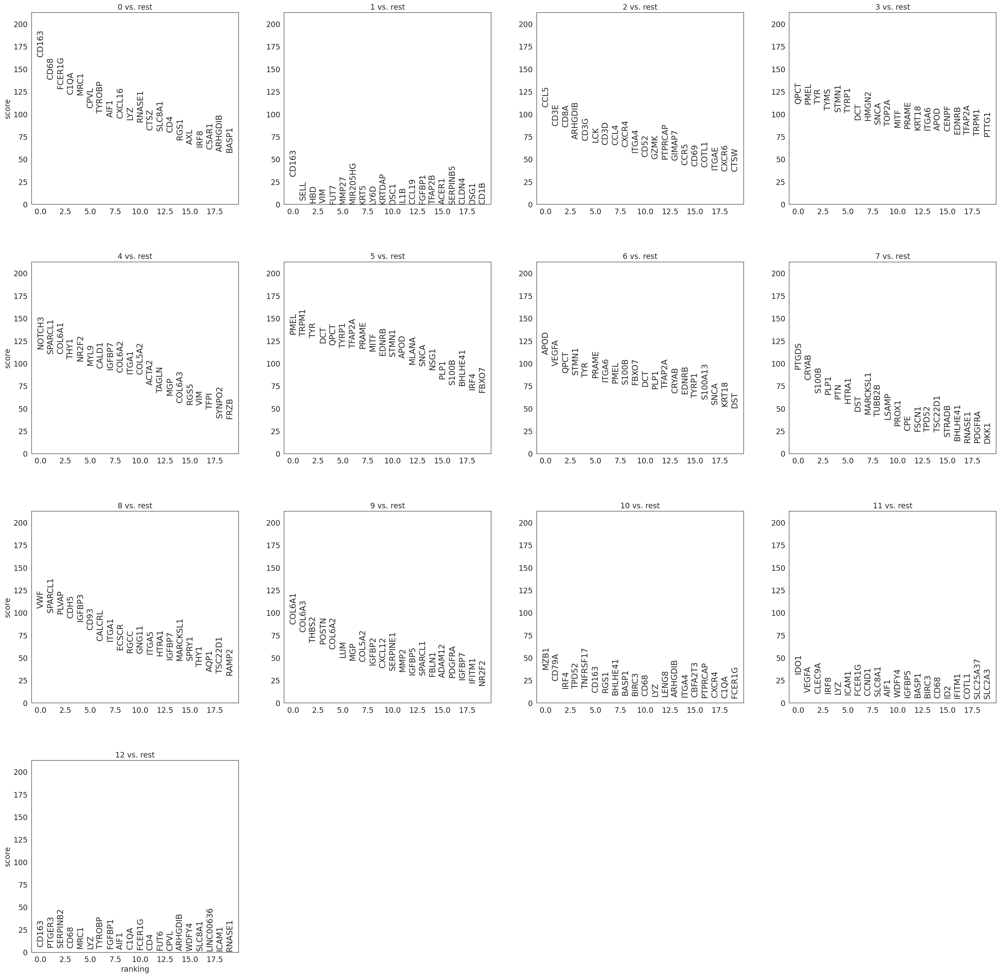

In [44]:
# Plot the gene markers for each cluster
sc.pl.rank_genes_groups(
    adata_spatial, 
    key=key_filtered,
    method='wilcoxon',
    #key=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers", 
    #key=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers_raw", 
    #key=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers_nbr_0", 
    #key=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers_nbr_1", 
    #key_added = 'banksy_cluster_pc35_nc0.20_r0.50_markers_raw',
    #key_added= "raw_test",
    n_genes=20, 
    fontsize=15,
    save= f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_spatial_top_gene_raw.png")

In [45]:
# # Plot the gene markers for each cluster as a violin plot that conpares to every other cluster
# with rc_context({"figure.figsize": (9, 1.5)}):
#     sc.pl.rank_genes_groups_violin(
#         adata_spatial, 
#         n_genes=20, 
#         jitter=False, 
#         key = key_filtered,
#         )

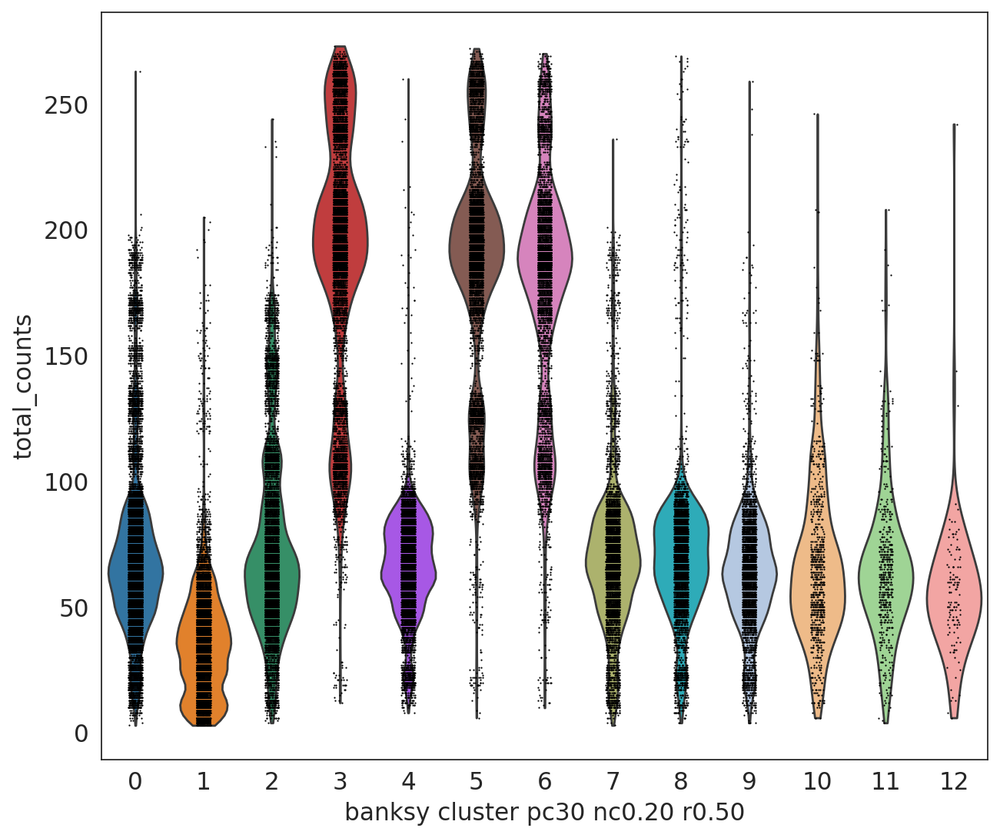

In [46]:
sc.pl.violin(
    adata_spatial, 
    "total_counts", 
    groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}", 
    save= f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}.png"
    )

         Falling back to preprocessing with `sc.pp.pca` and default params.


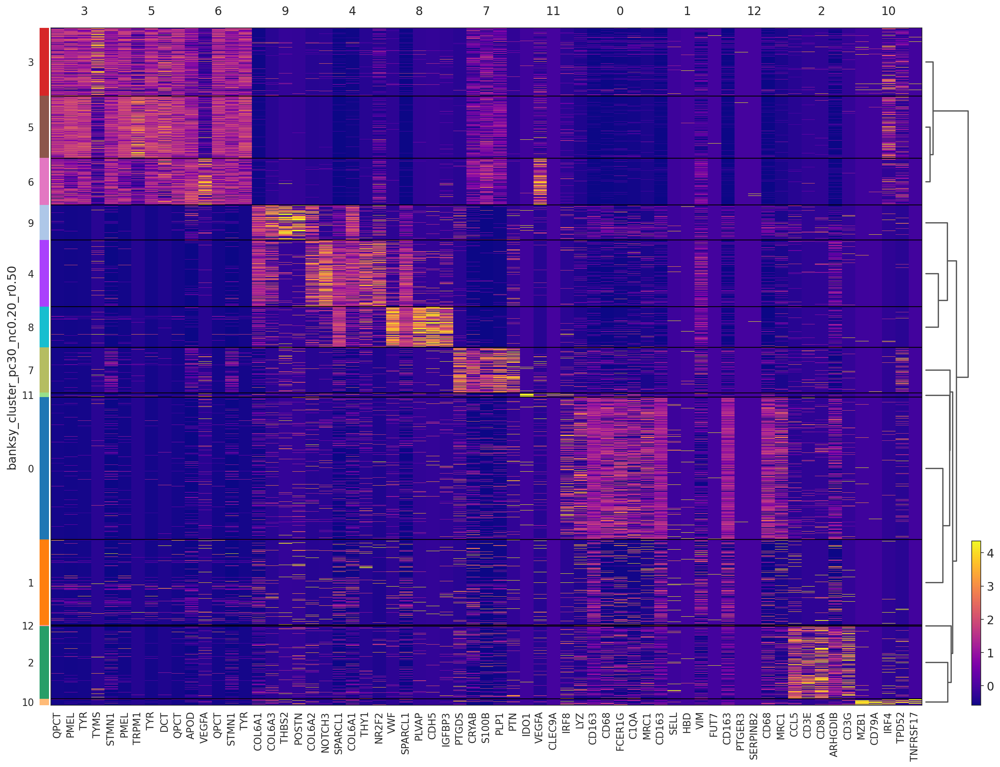

In [47]:
# Set the figure directory to your desired location
sc.settings.figdir = output_path

## Generate heat map for top markers per cluster
sc.tl.dendrogram(
    adata_spatial,
    groupby=f'banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_raw',
    key_added=f'banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_raw'
)

## Determine vmin and vmax dynamically based on gene expression
expr_values = adata_spatial.X
vmax_dynamic = np.percentile(expr_values[expr_values > 0], 99)
vmin_dynamic = np.percentile(expr_values, 1)

sc.pl.rank_genes_groups_heatmap(
    adata_spatial, 
    key=f'banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers_raw',
    #key= 'raw_test',
    n_genes=5,
    cmap = "plasma",
    vmin=vmin_dynamic,
    vmax=vmax_dynamic,
    show_gene_labels = True,
    save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_raw_markers.png",
    figsize=(20, 15)
)

In [48]:
adata_spatial.uns.keys()

odict_keys(['banksy_cluster_pc30_nc0.20_r0.50_markers', 'banksy_cluster_pc30_nc0.20_r0.50_markers_raw', 'banksy_cluster_pc30_nc0.20_r0.50_colors', 'banksy_cluster_pc30_nc0.20_r0.50_raw', 'dendrogram_banksy_cluster_pc30_nc0.20_r0.50'])

### Non-spatial clustering results

In [49]:
# banksy_dict['scaled_gaussian'][0.2]['adata'] #lambda = 0.2
adata_nonspatial.obs['banksy_cluster_nonspatial']= adata_nonspatial.obs[f"labels_nonspatial_pc{pca_label}_nc0.00_r{res_label}"].astype(str)

In [50]:
# ## Rank the genes for the non-spatial data

# sc.tl.rank_genes_groups(
#     adata_nonspatial,
#     groupby='banksy_cluster_nonspatial',
#     method='wilcoxon',
#     key_added='banksy_markers_nonspatial'
# )

In [51]:
# ## Plot the top 20 marker genes per cluster

# sc.pl.rank_genes_groups(
#     adata_nonspatial, 
#     key='banksy_markers_nonspatial', 
#     n_genes=20, 
#     fontsize=15,
#     save= f"_{dataset_name}_pc{pca_label}_r{res_label}_top_gene.png")

In [52]:
# sc.tl.dendrogram(
#     adata_spatial,
#     groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}"
# )

# sc.pl.rank_genes_groups_heatmap(
#     adata_nonspatial, 
#     key='banksy_markers_nonspatial', 
#     n_genes=5,
#     cmap = "plasma",
#     #vmin=0,
#     #vmax=2,
#     show_gene_labels = True,
#     save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}.png"
    


### Export the top 20 clusters in wide format to .csv

In [53]:
from banksy_utils.annotation_utils import export_clusters_wide

key= f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers_raw"

export_clusters_wide(
    adata= adata_spatial,
    key= key,
    gene_type= "raw",
    top_n= 20,
    dataset_name= dataset_name,
    file_path= processed_path
)

          0         1        2       3        4        5        6         7  \
0     CD163     CD163     CCL5    QPCT   NOTCH3     PMEL     APOD     PTGDS   
1      CD68      SELL     CD3E    PMEL  SPARCL1    TRPM1    VEGFA     CRYAB   
2    FCER1G       HBD     CD8A     TYR   COL6A1      TYR     QPCT     S100B   
3      C1QA       VIM  ARHGDIB    TYMS     THY1      DCT    STMN1      PLP1   
4      MRC1      FUT7     CD3G   STMN1    NR2F2     QPCT      TYR       PTN   
5      CPVL     MMP27      LCK   TYRP1     MYL9    TYRP1    PRAME     HTRA1   
6    TYROBP  MIR205HG     CD3D     DCT    CALD1   TFAP2A    ITGA6       DST   
7      AIF1      KRT5     CCL4   HMGN2   IGFBP7    PRAME     PMEL  MARCKSL1   
8    CXCL16      LY6D    CXCR4    SNCA   COL6A2     MITF    S100B    TUBB2B   
9       LYZ    KRTDAP    ITGA4   TOP2A    ITGA1    EDNRB    FBXO7     LSAMP   
10   RNASE1      DSC1     CD52    MITF   COL5A2    STMN1      DCT     PROX1   
11     CTSZ      IL1B     GZMK   PRAME    ACTA2     

### Export the top 20 clusters in long format with scores to .csv

In [54]:
from banksy_utils.annotation_utils import export_cluster_markers

cluster_markers = export_cluster_markers(
    adata = adata_spatial,
    key = key,
    top_n = 30,
    dataset_name = dataset_name,
    file_path = processed_path
)
print(cluster_markers)

     cluster       gene       score
0          0      CD163  163.445267
1          0       CD68  138.565048
2          0     FCER1G  128.379333
3          0       C1QA  121.748428
4          0       MRC1  121.169075
..       ...        ...         ...
268       12     SLC8A1    1.426093
269       12  LINC00636    1.362998
270       12      ICAM1    1.304344
271       12     RNASE1    1.236580
272       12    S100A14    1.224414

[273 rows x 3 columns]


### Add cell_type information to top clusters for manual annotation

In [55]:
## Read in the exported cluster markers generated with "export_clusters_wide()"
## and merge with the cell type annotation master document
n_genes_label =  20 # Set this to the number of genes that were exorted as top markers for each cluster
#top_markers = pd.read_csv(f"{processed_path}cluster_top_{n_genes_label}_genes_with_scores_{dataset_name}_{key}.csv", index_col=0) #index_col = 0 prevents insertion of an unnamed col
#top_markers = top_markers.sort_index()
top_markers = cluster_markers.sort_index()
#print(top_markers)

## Read in the master annotation file which contains all the curated cell type labels for each marker gene
master_markers_file = pd.read_csv(f"{raw_data}xenium_gene_list_annotation_master.csv")

## Create a data frame of the genes and their corresponding primary and secondary cell type annotations 
cell_annotations = master_markers_file[["Gene", "primary_annotation", "secondary_annotation"]]
#cell_annotations = cell_annotations.sort_index()

## Merge the top marker results and the cell type annotations
merged_markers = (
    pd.merge(
        top_markers.reset_index(), 
        cell_annotations, 
        left_on="gene", 
        right_on="Gene", 
        how="left", 
        sort="False",
        validate="m:1"
    )
    .set_index("index")
    .loc[top_markers.index]
)

merged_markers = merged_markers.drop("Gene", axis=1)
print(merged_markers)

## Export the cell type annotated top markers to .csv to use in manual annotation and ChatGPT annotation
merged_markers.to_csv(f"{processed_path}cell_type_cluster_top_{n_genes_label}_genes_{dataset_name}_{key}.csv")

     cluster       gene       score              primary_annotation  \
0          0      CD163  163.445267                             NaN   
1          0       CD68  138.565048            Macrophages and DC_1   
2          0     FCER1G  128.379333            Macrophages and DC_3   
3          0       C1QA  121.748428                     Macrophages   
4          0       MRC1  121.169075                             NaN   
..       ...        ...         ...                             ...   
268       12     SLC8A1    1.426093                  DC_AXL_SIGLEC6   
269       12  LINC00636    1.362998     Lymphatic Endothelial Cells   
270       12      ICAM1    1.304344                             NaN   
271       12     RNASE1    1.236580  Endothelial cells; Macrophages   
272       12    S100A14    1.224414    EpSC and Other Progenitors_2   

                 secondary_annotation  
0                                 NaN  
1                         macrophages  
2                         m

## Relabel cluster with cell type annotation

In [56]:
## The top 20 gene markers for each cluster are assessed for cell cluster annotation

new_labels = {
    '0' : 'M2-like_tumour_associated_macrophages_0',
    '1' : 'Myeloid_cells_(low_confidence)_1',
    '2' : 'CD8__cytotoxic_T_cells_(ITGAE+)_2',
    '3' : 'Cycling_melanoma_cells_3',
    '4' : 'Perivascular-like_Smooth_muscle_cells/Pericytes_4',
    '5' : 'Neural_crest-like_differentiated_melanoma_cells_5', 
    '6' : 'Stress-adapted_neural-like_melanoma_cells_6',
    '7' : 'Glial_cells_(DKK1+)_7',
    '8' : 'Vascular_endothelial_cells_8',
    '9' : 'Cancer_associated_fibroblasts_9',
    '10' : 'Plasma_cells_10',
    '11' : 'DC-like_TAMs/Inflammatory_macrophages_11',
    '12' : 'M2-like_tumour_associated_macrophages_(Immuneregulatory)_12'
}

cluster_col = f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}"
adata_spatial.obs[f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann"] = adata_spatial.obs[cluster_col].map(new_labels)

new_labels

{'0': 'M2-like_tumour_associated_macrophages_0',
 '1': 'Myeloid_cells_(low_confidence)_1',
 '2': 'CD8__cytotoxic_T_cells_(ITGAE+)_2',
 '3': 'Cycling_melanoma_cells_3',
 '4': 'Perivascular-like_Smooth_muscle_cells/Pericytes_4',
 '5': 'Neural_crest-like_differentiated_melanoma_cells_5',
 '6': 'Stress-adapted_neural-like_melanoma_cells_6',
 '7': 'Glial_cells_(DKK1+)_7',
 '8': 'Vascular_endothelial_cells_8',
 '9': 'Cancer_associated_fibroblasts_9',
 '10': 'Plasma_cells_10',
 '11': 'DC-like_TAMs/Inflammatory_macrophages_11',
 '12': 'M2-like_tumour_associated_macrophages_(Immuneregulatory)_12'}

In [57]:
## Store the UMAP results in the .obsm slot
adata_spatial.obsm['X_umap'] = banksy_dict['scaled_gaussian'][0.2]['adata'].obsm[f"reduced_pc_{pca_label}_umap"]

## Visualisations

### Cluster Annotated UMAP

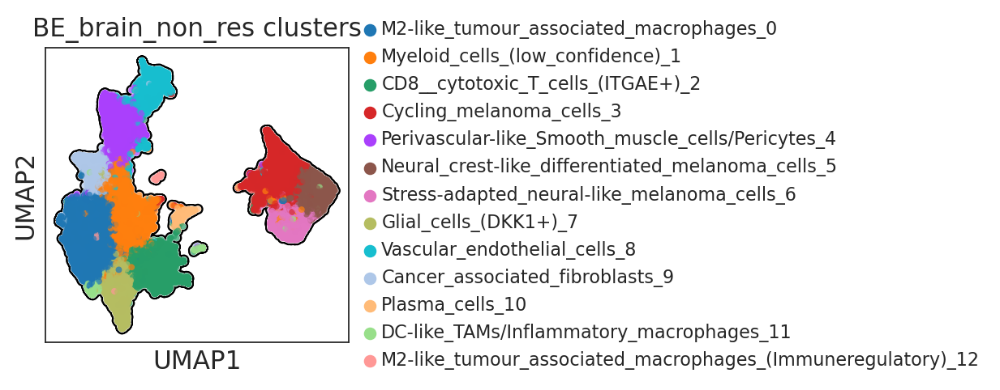

In [58]:
# Plot the umap with bulk labels
import scanpy as sc
from matplotlib.pyplot import rc_context

color_vars = [
f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann"
]

with rc_context({"figure.figsize": (3,3)}):
    sc.pl.umap(
        adata_spatial, 
        color=color_vars, 
        s=50, 
        frameon=True, 
        vmax="p99",
        add_outline=True,
        legend_fontsize=10,
        title=f"{dataset_name} clusters",
        save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}.png"
        )

### Gene of interest UMAP plotting

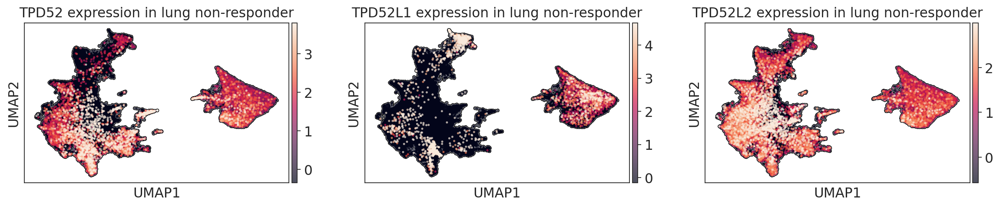

In [59]:
color_vars = [
"TPD52", "TPD52L1", "TPD52L2"
]

with rc_context({"figure.figsize": (5,3)}):
    sc.pl.umap(
        adata_spatial, 
        color=color_vars, 
        s=20, 
        frameon=True, 
        vmax="p99",
        add_outline=True,
        legend_fontsize=9,
        title=["TPD52 expression in lung non-responder", "TPD52L1 expression in lung non-responder", "TPD52L2 expression in lung non-responder"],
        save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_TPD52-like_genes.png"
        )

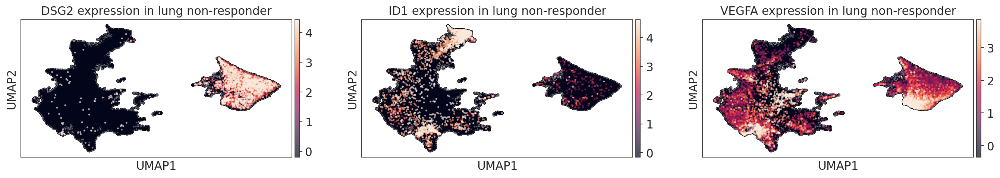

In [60]:
color_vars = [
"DSG2", "ID1", "VEGFA"
]

with rc_context({"figure.figsize": (6,3)}):
    sc.pl.umap(
        adata_spatial, 
        color=color_vars, 
        s=20, 
        frameon=True, 
        vmax="p99",
        add_outline=True,
        legend_fontsize=9,
        title=["DSG2 expression in lung non-responder", "ID1 expression in lung non-responder", "VEGFA expression in lung non-responder"],
        save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_DSG2_ID1_VEGFA.png"
        )

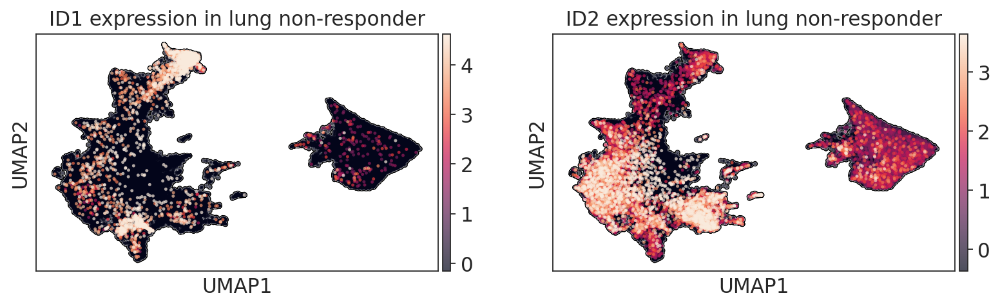

In [61]:
color_vars = [
"ID1", "ID2"
]

with rc_context({"figure.figsize": (5,3)}):
    sc.pl.umap(
        adata_spatial, 
        color=color_vars, 
        s=20, 
        frameon=True, 
        vmax="p99",
        add_outline=True,
        legend_fontsize=9,
        title=["ID1 expression in lung non-responder", "ID2 expression in lung non-responder"],
        save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_ID1_ID2.png"
        )

### Gene expression Dotplot

In [62]:
# new_labels = {
#     '0' : 'M2-like_tumour_associated_macrophages_0',
#     '1' : 'Myeloid_cells_(low_confidence)_1',
#     '2' : 'CD8__cytotoxic_T_cells_(ITGAE+)_2',
#     '3' : 'Cycling_melanoma_cells_3',
#     '4' : 'Perivascular-like_Smooth_muscle_cells/Pericytes_4',
#     '5' : 'Neural_crest-like_differentiated_melanoma_cells_5', 
#     '6' : 'Stress-adapted_neural-like_melanoma_cells_6',
#     '7' : 'Glial_cells_(DKK1+)_7',
#     '8' : 'Vascular_endothelial_cells_8',
#     '9' : 'Cancer_associated_fibroblasts_9',
#     '10' : 'Plasma_cells_10',
#     '11' : 'DC-like_TAMs/Inflammatory_macrophages_11',
#     '12' : 'M2-like_tumour_associated_macrophages_(Immuneregulatory)_12'
# }

In [63]:
from banksy_utils.annotation_utils import extract_marker_genes_dict

subset_cluster= ["M2-like_tumour_associated_macrophages_0"]
#"DC-like_TAMs/Inflammatory_macrophages_11",
#"M2-like_tumour_associated_macrophages_(Immuneregulatory)_12"

marker_genes_dict=extract_marker_genes_dict(
    adata=adata_spatial, 
    filtered_key=key_filtered, 
    gene_type='raw', 
    groupby = f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann",
    subset_cluster= subset_cluster,
    top_n=20
    )
marker_genes_dict

# Create a list of genes for this small dictionary so that the dendogram can be sorted by similarity
#marker_genes_list = marker_genes_dict["Tumour Myeloid Cells_7"]

{'M2-like_tumour_associated_macrophages_0': ['CD163',
  'CD68',
  'FCER1G',
  'C1QA',
  'MRC1',
  'CPVL',
  'TYROBP',
  'AIF1',
  'CXCL16',
  'LYZ',
  'RNASE1',
  'CTSZ',
  'SLC8A1',
  'CD4',
  'RGS1',
  'AXL',
  'IRF8',
  'C5AR1',
  'ARHGDIB',
  'BASP1']}

In [64]:
# all_genes_test = sum(marker_genes_dict.values(), [])
# print(all_genes_test)

categories: M2-like_tumour_associated_macrophages_0, Myeloid_cells_(low_confidence)_1, CD8__cytotoxic_T_cells_(ITGAE+)_2, etc.
var_group_labels: M2-like_tumour_associated_macrophages_0


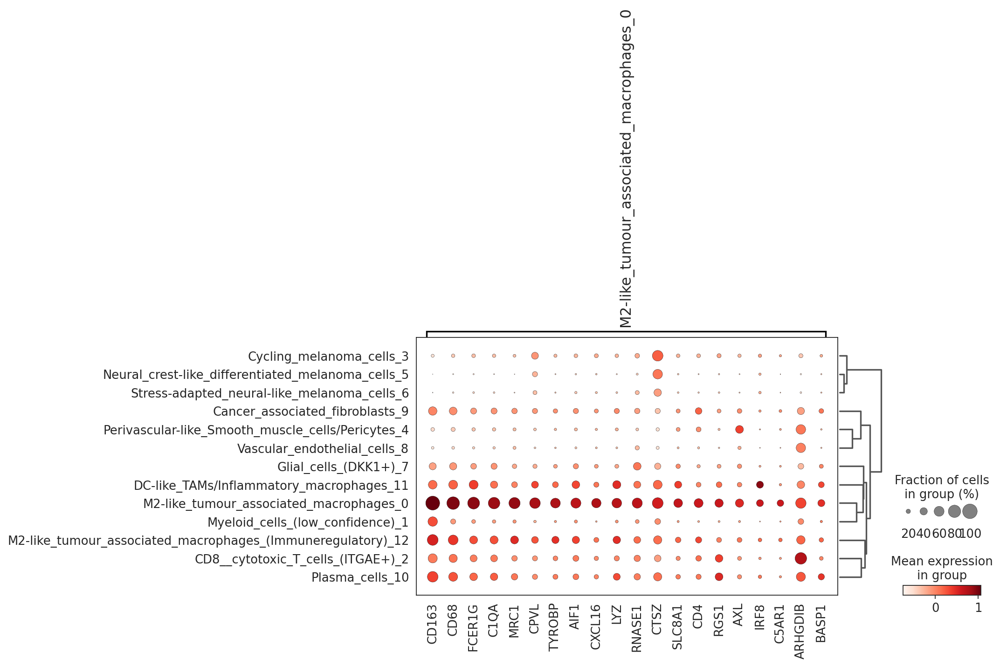

In [65]:
## Ensure that the patch line edge colopur is set to black in global matplotlib rcparams so that the bracket to group genes per cluster is shown
plt.rcParams['patch.edgecolor'] = 'black'

## Compute the dendrogram for clusters
sc.tl.dendrogram(
    adata_spatial,
    groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann"
    )

## Generate dot plot
sc.pl.dotplot(
    adata_spatial,
    #marker_genes_list,
    marker_genes_dict,
    groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann",
    dendrogram=True,
    save=f"{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_dot_plot.png"
    )

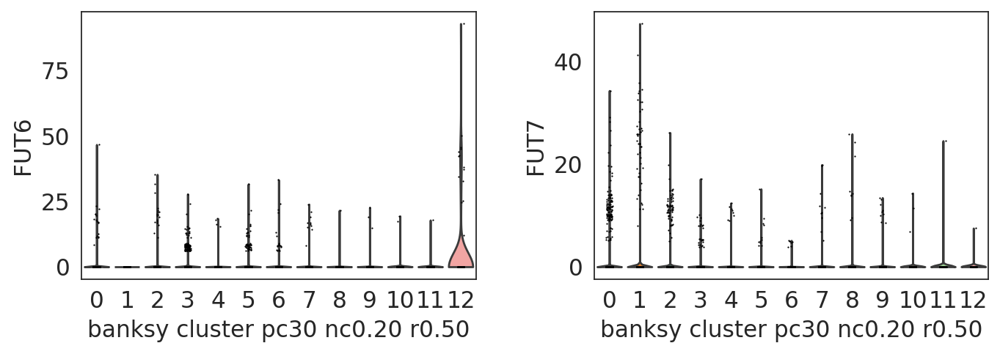

In [66]:
with rc_context({"figure.figsize": (4.5, 3)}):
    sc.pl.violin(
        adata_spatial, ["FUT6", "FUT7"], 
        groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}",
        save=f"{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_FUT6_FUT7_violin_plot.png"
        )


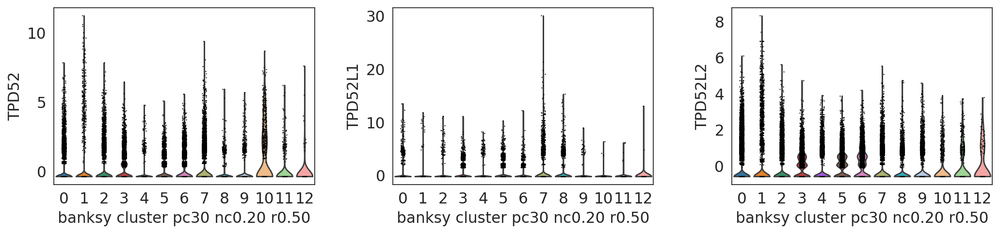

In [67]:
with rc_context({"figure.figsize": (4.5, 3)}):
    sc.pl.violin(
        adata_spatial, 
        ["TPD52", "TPD52L1", "TPD52L2"], 
        groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}",
        save=f"{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_TPD54_family_violin_plot.png"
        )

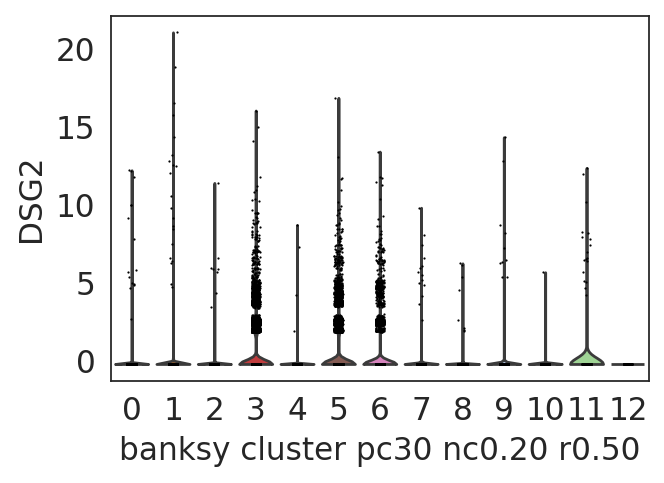

In [68]:
with rc_context({"figure.figsize": (4.5, 3)}):
    sc.pl.violin(
        adata_spatial, 
        ["DSG2"], 
        groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}",
        save=f"{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_DSG2_violin_plot.png"
        )

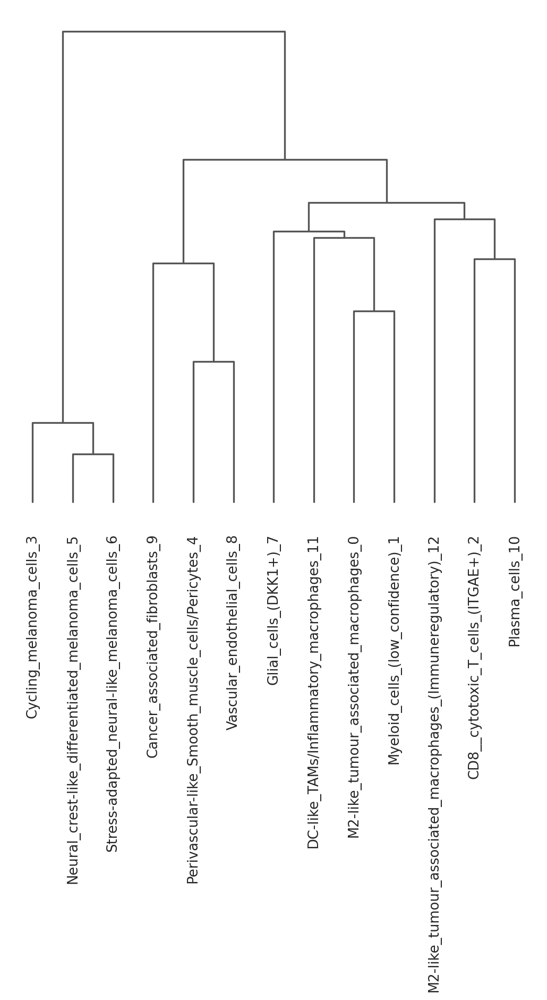

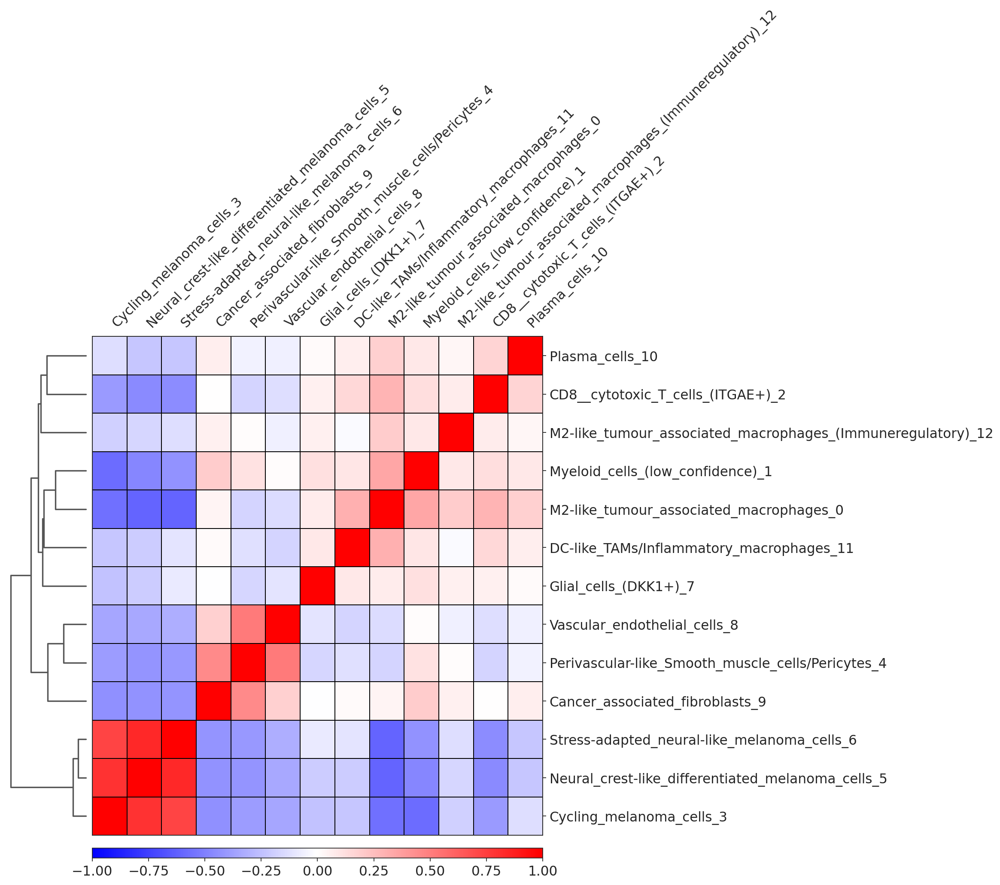

In [69]:
sc.pl.dendrogram(
    adata_spatial,
    groupby=f'banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann',
    save=f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}.png"
)


sc.pl.correlation_matrix(
    adata_spatial,
    #groupby='banksy_cluster_pc35_nc0.20_r0.50_raw',
    groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann",
    save=f"{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_cluster_correlation_plot.png",
    figsize=(10, 10)
)

## Export the banksy dictionary, the adata objects and the results_df


In [72]:
# Save AnnData objects with clustering results

adata_spatial.write_h5ad(
    filename = f"{output_path}{dataset_name}_clustered_spatial_pc{pca_label}_nc{lambda_label}_r{res_label}.h5ad",
    compression="gzip"
    )

adata_nonspatial.write_h5ad(
    filename = f"{output_path}{dataset_name}_clustered_nonspatial_pc{pca_label}_r{res_label}.h5ad"
)

In [73]:
## Export the banksy_dict dictionary as a .pkl file
## Use gzip to save it with compression
import gzip
import pickle
with gzip.open(f"{output_path}{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_banksy_dict.pkl.gz", "wb") as f:
    pickle.dump(banksy_dict, f)


## Export the results_df data frame as a .pkl file
with gzip.open(f"{output_path}results_df_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}.pkl.gz", "wb") as f:
    pickle.dump(results_df, f)